# Import Data & Do basic data preprocessing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

baskets = pd.read_csv('baskets_sample.csv') 
category = pd.read_csv('category_spends_sample.csv') 
customers = pd.read_csv('customers_sample.csv') 
lineitems = pd.read_csv('lineitems_sample.csv')
print(baskets.shape, category.shape, customers.shape, lineitems.shape)

(195547, 5) (3000, 21) (3000, 6) (1461315, 6)


In [3]:
# check data
lineitems.head()

,customer_number,purchase_time,product_id,category,quantity,spend
0,14577,2007-03-10 11:58:00,722653,GROCERY_FOOD,1,£1.39
1,7210,2007-03-22 10:53:00,696136,GROCERY_HEALTH_PETS,1,£4.25
2,3145,2007-03-26 11:17:00,139543,GROCERY_HEALTH_PETS,1,£0.50
3,2649,2007-03-12 16:05:00,34890,BAKERY,1,£0.57
4,859,2007-03-10 09:53:00,613984,BAKERY,1,£1.59


In [4]:
#-->spend is not float, and special symbol need to be deleted.
lineitems = lineitems.set_index('customer_number')
lineitems['spend'] = pd.DataFrame(lineitems['spend'].str.replace('£', '').str.replace(',', ''),dtype=np.float)
lineitems.head(2)

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
14577,2007-03-10 11:58:00,722653,GROCERY_FOOD,1,1.39
7210,2007-03-22 10:53:00,696136,GROCERY_HEALTH_PETS,1,4.25


In [5]:
lineitems.describe()
#--> negative values in "quantity" and "spend"

,product_id,quantity,spend
count,1.461315e+06,1.461315e+06,1.461315e+06
mean,3.940964e+05,1.198349e+00,1.579563e+00
std,2.989743e+05,5.990824e-01,2.576834e+00
min,2.200000e+01,-1.300000e+01,-1.000000e+02
25%,6.027800e+04,1.000000e+00,6.800000e-01
50%,5.612280e+05,1.000000e+00,1.030000e+00
75%,6.953890e+05,1.000000e+00,1.730000e+00
max,7.450580e+05,1.000000e+02,3.600000e+02


In [6]:
#baskets.head(2)
baskets = baskets.set_index('customer_number')
baskets['basket_spend'] = pd.DataFrame(baskets['basket_spend'].str.replace('£', '').str.replace(',', ''),dtype=np.float)
print(baskets.shape)
baskets.head(2)

(195547, 4)


,purchase_time,basket_quantity,basket_spend,basket_categories
customer_number,,,,
11911,2007-03-01 07:06:00,7,3.09,3
4047,2007-03-01 07:13:00,9,7.99,5


In [7]:
baskets.describe()
#--> negative values in "basket_quantity" and "basket_spend"

,basket_quantity,basket_spend,basket_categories
count,195547.000000,195547.000000,195547.000000
mean,8.955218,11.804010,4.231990
std,9.510890,13.031542,2.478016
min,-11.000000,-98.400000,1.000000
25%,3.000000,4.280000,2.000000
50%,6.000000,8.130000,4.000000
75%,11.000000,14.480000,6.000000
max,190.000000,377.280000,16.000000


In [8]:
category = category.set_index('customer_number')
for i in category.columns:
    category[i] = pd.DataFrame(category[i].str.replace('£', '').str.replace(',', ''),dtype=np.float)
category.head(2)

,fruit_veg,dairy,confectionary,grocery_food,grocery_health_pets,bakery,newspapers_magazines,prepared_meals,soft_drinks,frozen,meat,tobacco,drinks,deli,world_foods,lottery,cashpoint,seasonal_gifting,discount_bakery,practical_items
customer_number,,,,,,,,,,,,,,,,,,,,
11387,64.58,35.91,107.78,27.08,29.59,0.0,54.83,6.35,22.83,21.51,28.62,162.1,28.02,28.12,28.54,2.0,15.0,7.48,0.0,0.84
8171,16.89,37.24,28.84,33.43,66.40,0.0,22.06,12.09,2.34,78.74,26.44,0.0,8.42,2.65,3.76,0.0,0.0,9.99,0.0,0.00


In [9]:
category.describe()
#--> negative values in "lottery" --> because customers win

,fruit_veg,dairy,confectionary,grocery_food,grocery_health_pets,bakery,newspapers_magazines,prepared_meals,soft_drinks,frozen,meat,tobacco,drinks,deli,world_foods,lottery,cashpoint,seasonal_gifting,discount_bakery,practical_items
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.0,3000.000000,3000.00000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,69.456163,71.302683,57.347793,60.007530,60.909867,0.0,16.653390,35.48057,23.303350,35.466020,54.740687,92.547613,62.242217,13.736440,8.554260,14.165603,45.330583,6.126987,1.814837,2.016220
std,70.499654,57.966265,55.959350,57.682533,69.805023,0.0,26.377091,41.24047,35.695592,41.477609,67.802126,201.703812,121.500365,25.486136,14.757745,48.469754,123.584361,13.104271,9.450367,4.322232
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-74.000000,0.000000,0.000000,0.000000,0.000000
25%,22.695000,31.390000,21.070000,21.087500,18.145000,0.0,1.500000,8.70000,3.750000,8.777500,12.640000,0.000000,0.000000,0.000000,0.890000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,50.935000,56.875000,42.290000,44.030000,39.075000,0.0,7.345000,23.09500,11.685000,22.275000,32.930000,2.030000,12.830000,3.495000,3.760000,0.000000,0.000000,1.990000,0.000000,0.000000
75%,93.405000,95.327500,75.125000,80.922500,77.250000,0.0,19.687500,47.33000,28.782500,47.237500,72.380000,81.030000,65.150000,15.770000,10.647500,6.000000,30.000000,6.720000,0.000000,2.510000
max,1262.970000,708.040000,614.370000,1017.070000,884.450000,0.0,351.730000,454.29000,529.650000,385.800000,713.280000,2488.940000,1005.330000,316.190000,321.490000,946.000000,2137.010000,229.440000,173.060000,65.060000


In [10]:
customers.head(2)
customers = customers.set_index('customer_number')
customers['total_spend'] = pd.DataFrame(customers['total_spend'].str.replace('£', '').str.replace(',', ''),dtype=np.float)
customers['average_spend'] = pd.DataFrame(customers['average_spend'].str.replace('£', ''),dtype=np.float)

customers.head(2)

,baskets,total_quantity,average_quantity,total_spend,average_spend
customer_number,,,,,
4749,220,260,1.181818,631.12,2.87
4757,248,333,1.342742,452.42,1.82


# check total_spend
conclusion : Total spend in comsumers, baskets, lineitems are same.   Total spend from catogory is different because "bakery" data is missing, and it should be updated.

In [22]:
# total_spend_table from baskets
total_spend_baskets = pd.DataFrame(baskets.groupby(by = 'customer_number')['basket_spend'].agg('sum')).rename(columns = {'basket_spend':'spend_from_baskets'})

# total spend from lineitems table
total_from_line = pd.DataFrame(lineitems.groupby(by = 'customer_number')['spend'].agg('sum')).rename(columns = {'spend':'spend_from_line'})

# total spend from category table
total_from_cate = pd.DataFrame(category.sum(axis = 1),columns = ['spend_from_cate'])

# total spend from customers 
total_from_customers = customers[['total_spend']].rename(columns = {'total_spend':'spend_from_customers'})

# join four tables and compare total spend computed from each table
total_spend_table = total_spend_baskets.join(total_from_line).join(total_from_cate).join(total_from_customers)
total_spend_table.head(2)

#--> spend_from_cate is different from others.

,spend_from_baskets,spend_from_line,spend_from_cate,spend_from_customers
customer_number,,,,
14,675.72,675.72,657.63,675.72
45,585.73,585.73,567.73,585.73


In [23]:
# use category information from lineitems table to check category data.

# cate_spend_from_category
cate_spend_from_category = pd.DataFrame(category.sum(axis = 0),columns = ['from_cate'])
#print(cate_spend_from_category.head())

#cate_spend_from_line
cate_spend_from_line = pd.DataFrame(lineitems.groupby(by = 'category')['spend'].agg('sum')).reset_index()
cate_spend_from_line['category'] = cate_spend_from_line['category'].str.lower()
cate_spend_from_line = cate_spend_from_line.set_index('category').rename(columns = {'spend':'from_line'})
#print(cate_spend_from_line.head())

# join table
cate_spend = cate_spend_from_category.join(cate_spend_from_line)
cate_spend['same?'] = abs(cate_spend['from_cate'] - cate_spend['from_line']) <1
cate_spend

#--> so the "bakery" data in category table is missing , and can be computed from lineitems.

,from_cate,from_line,same?
fruit_veg,208368.49,208368.49,True
dairy,213908.05,213908.05,True
confectionary,172043.38,172043.38,True
grocery_food,180022.59,180022.59,True
grocery_health_pets,182729.60,182729.60,True
bakery,0.00,114630.37,False
newspapers_magazines,49960.17,49960.17,True
prepared_meals,106441.71,106441.71,True
soft_drinks,69910.05,69910.05,True
frozen,106398.06,106398.06,True


In [24]:
# double check:

# compute total spend from lineitems without bakery data
line_spend_category = pd.DataFrame(lineitems.groupby(by = ['customer_number','category'])['spend'].agg('sum'))
line_spend_category = line_spend_category.reset_index().pivot(columns = 'category',values='spend',index = 'customer_number')
line_spend_category_drop_bakery = pd.DataFrame(line_spend_category.drop(columns=['BAKERY']).sum(axis = 1), columns=['total_from_line_without_bakery'])
#line_spend_category_drop_bakery.head()

#join all table
total_spend_table = total_spend_baskets.join(total_from_line).join(total_from_cate).join(total_from_customers).join(line_spend_category_drop_bakery)
total_spend_table.head(2)

#--> spend_from_baskets = spend_from_line = spend_from_customers  :  right
#--> spend_from_categories = total_from_line_without_bakery  : wrong
#--> the different of spend_from_customers and spend_from_categories is exactly bakery spend data
#--> so, need to update "bakery" in category table, and update 'total_spend' in customer table

,spend_from_baskets,spend_from_line,spend_from_cate,spend_from_customers,total_from_line_without_bakery
customer_number,,,,,
14,675.72,675.72,657.63,675.72,657.63
45,585.73,585.73,567.73,585.73,567.73


In [27]:
#update "bakery" in category table
bakery_from_line = pd.DataFrame(lineitems[lineitems['category'] == 'BAKERY'].groupby(by = 'customer_number')['spend'].agg('sum'))

category = category.drop(columns = 'bakery').join(bakery_from_line).rename(columns = {'spend':'bakery'}).fillna(0)
category = category.iloc[:,[0,1,2,3,4,19,5,6,7,8,9,10,11,12,13,14,15,16,17,18]]
category.head(2)

,fruit_veg,dairy,confectionary,grocery_food,grocery_health_pets,bakery,newspapers_magazines,prepared_meals,soft_drinks,frozen,meat,tobacco,drinks,deli,world_foods,lottery,cashpoint,seasonal_gifting,discount_bakery,practical_items
customer_number,,,,,,,,,,,,,,,,,,,,
11387,64.58,35.91,107.78,27.08,29.59,26.58,54.83,6.35,22.83,21.51,28.62,162.1,28.02,28.12,28.54,2.0,15.0,7.48,0.0,0.84
8171,16.89,37.24,28.84,33.43,66.40,20.02,22.06,12.09,2.34,78.74,26.44,0.0,8.42,2.65,3.76,0.0,0.0,9.99,0.0,0.00


# check baskets (frequency)
conclusion : baskets from customers table is count of lines, but customers may(usually) buy more than one lines in each baskets, so it should be updated from baskets table or lineitems table(baskets number from these two tables are same).

In [28]:
# frequency from basekts
freq_from_baskets = pd.DataFrame(baskets.reset_index().groupby(by = 'customer_number')['purchase_time'].agg('count')).rename(columns={'purchase_time':'freq_from_baskets'})
#freq_from_baskets.head()

# freq from line
freq_from_line = pd.DataFrame(lineitems.groupby(by = ['customer_number'])['purchase_time'].nunique()).rename(columns = {'purchase_time':'from_line'})
#freq_from_line.head()

# freq from customers
freq_from_customers = pd.DataFrame(customers['baskets']).rename(columns = {'baskets':'from_customers'})
#freq_from_customers.head()

# line counts from line table
line_counts_from_line = pd.DataFrame(lineitems.groupby(by = ['customer_number'])['purchase_time'].agg('count')).rename(columns = {'purchase_time':'line_counts_from_line'})

# join all table
freq_from_baskets.join(freq_from_line).join(freq_from_customers).join(line_counts_from_line).head(3)

#--> freq_from_baskets = from_line from_customers,  right, they are ferquency
#--> from_customers = line_counts_from_line, wrong, they are count of lines 
#               rather than frequency(baskets), because each basket has many lines.


,freq_from_baskets,from_line,from_customers,line_counts_from_line
customer_number,,,,
14,56,56,381,381
45,33,33,561,561
52,59,59,206,206


In [29]:
# update baskets of customers table.
customers = customers.drop(columns = 'baskets').join(freq_from_baskets)
customers.head(2)

,total_quantity,average_quantity,total_spend,average_spend,freq_from_baskets
customer_number,,,,,
4749,260,1.181818,631.12,2.87,92
4757,333,1.342742,452.42,1.82,27


# check total quantity
data in all tables are same and right

In [30]:
#quantity from baskets
total_quant_from_baskets = pd.DataFrame(baskets.reset_index().groupby(by = 'customer_number')['basket_quantity'].agg('sum')).rename(columns={'basket_quantity':'quant_from_baskets'})
#total_quant_from_baskets.head()

#quantity from line
total_quant_from_line = pd.DataFrame(lineitems.groupby(by = ['customer_number'])['quantity'].agg('sum')).rename(columns = {'quantity':'from_line'})

#quantity from customers
total_quant_from_customers = pd.DataFrame(customers['total_quantity']).rename(columns = {'total_quantity':'from_customers'})

# join tables
quantity_table = total_quant_from_baskets.join(total_quant_from_line).join(total_quant_from_customers)
quantity_table.head(2)

#--> all are same

,quant_from_baskets,from_line,from_customers
customer_number,,,
14,531,531,531
45,655,655,655


# handle negative values
conclusion:  "Lottery" : 842 negative values, because people win. these row should be deleted, as winning is not customers' purchase behavior.//////
"soft drinks": 14 negative values, and most are caused by customer 15972, don't know why. so it can be treated as outliers. ///////
Some catogories have a few negative values because of refund. 
 Overall, negative values can be deleted.

In [242]:
# negative values in lineitems table
lineitems[lineitems['quantity'] < 0]
print(lineitems[lineitems['quantity'] < 0]['category'].value_counts())

LOTTERY                842
SOFT_DRINKS             14
GROCERY_HEALTH_PETS      3
CONFECTIONARY            2
DRINKS                   1
MEAT                     1
DELI                     1
Name: category, dtype: int64


In [243]:
lineitems.loc[(lineitems['quantity'] < 0) & (lineitems['category'] == 'LOTTERY'),:].head(2)
#--> LOTTERY is negative because people win

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
6922,2007-03-29 11:16:00,106149,LOTTERY,-1,-10.0
10591,2007-03-05 17:57:00,106149,LOTTERY,-1,-1.0


In [645]:
lineitems.loc[(lineitems['quantity'] < 0) & (lineitems['category'] != 'LOTTERY'),:]

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
12650,2007-03-28 15:03:00,104074,GROCERY_HEALTH_PETS,-1,-1.96
14891,2007-03-03 13:20:00,633312,GROCERY_HEALTH_PETS,-1,-2.63
7955,2007-03-04 15:19:00,687882,GROCERY_HEALTH_PETS,-1,-6.19
15972,2007-04-20 12:36:00,155613,SOFT_DRINKS,-12,-2.04
15972,2007-04-06 10:58:00,155613,SOFT_DRINKS,-4,-0.68
6834,2007-04-26 15:13:00,31643,DRINKS,-1,-3.82
7955,2007-04-03 16:11:00,28795,CONFECTIONARY,-1,-1.01
13031,2007-04-07 12:17:00,643451,CONFECTIONARY,-4,-34.01
15972,2007-05-26 13:35:00,155613,SOFT_DRINKS,-7,-1.19


In [245]:
a_6834 = lineitems.loc[6834,:]
a_6834[a_6834['category']=='DRINKS'].sort_values('purchase_time')
#--> get refund
#purchase_time	product_id	category	quantity	spend
#6834	2007-04-26 15:05:00	31643	DRINKS	1	3.82
#6834	2007-04-26 15:13:00	31643	DRINKS	-1	-3.82

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
6834,2007-03-06 16:26:00,587302,DRINKS,1,4.25
6834,2007-03-09 16:25:00,587302,DRINKS,6,25.48
6834,2007-03-24 11:20:00,587302,DRINKS,5,21.23
6834,2007-03-30 17:55:00,587302,DRINKS,4,13.58
6834,2007-04-06 15:07:00,587302,DRINKS,4,13.58
6834,2007-04-11 16:28:00,587302,DRINKS,4,13.58
6834,2007-04-20 10:41:00,587302,DRINKS,1,4.25
6834,2007-04-21 09:22:00,587302,DRINKS,3,12.74
6834,2007-04-26 15:05:00,31643,DRINKS,1,3.82


In [246]:
a_12650 = lineitems.loc[12650,:]
a_12650[a_12650['category']=='GROCERY_HEALTH_PETS'].sort_values('purchase_time')
#-->cannot find the correspending postive row of negative row
#-->possible scenario: customer return A product, but cannot get full refund

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
12650,2007-03-22 17:01:00,574078,GROCERY_HEALTH_PETS,2,0.41
12650,2007-03-22 17:01:00,574079,GROCERY_HEALTH_PETS,4,0.82
12650,2007-03-27 17:53:00,39684,GROCERY_HEALTH_PETS,3,0.43
12650,2007-03-27 17:53:00,104074,GROCERY_HEALTH_PETS,2,7.69
12650,2007-03-28 15:03:00,104074,GROCERY_HEALTH_PETS,-1,-1.96
12650,2007-03-28 15:28:00,624592,GROCERY_HEALTH_PETS,1,0.50


In [247]:
#negative values in baskets table
#baskets.head()
baskets[baskets['basket_quantity'] < 0][['purchase_time','basket_quantity','basket_spend']]

,purchase_time,basket_quantity,basket_spend
customer_number,,,
14891,2007-03-03 13:20:00,-1,-2.63
7955,2007-03-04 15:19:00,-1,-6.19
12650,2007-03-28 15:03:00,-1,-1.96
7955,2007-04-03 16:11:00,-1,-1.01
15972,2007-04-06 10:58:00,-2,0.60
13031,2007-04-07 12:17:00,-4,-34.01
15972,2007-04-20 12:36:00,-4,3.06
6415,2007-04-23 16:12:00,-1,-10.00
6834,2007-04-26 15:13:00,-1,-3.82


In [248]:
a = lineitems.loc[15972,:]
a[a['purchase_time'] =='2007-04-20 12:36:00']

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
15972,2007-04-20 12:36:00,155613,SOFT_DRINKS,-12,-2.04
15972,2007-04-20 12:36:00,176523,SOFT_DRINKS,4,2.55
15972,2007-04-20 12:36:00,214255,SOFT_DRINKS,4,2.55


In [249]:
# check DELI
lineitems.loc[(lineitems['quantity'] < 0) & (lineitems['category'] == 'DELI'),:]
a_10438 = lineitems.loc[10438,:]
a_10438[a_10438['category']=='DELI']
#--> refund

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
10438,2007-04-26 14:21:00,651266,DELI,1,2.49
10438,2007-06-04 20:20:00,181899,DELI,1,0.20
10438,2007-06-25 20:56:00,657155,DELI,1,0.50
10438,2007-07-11 19:09:00,651266,DELI,1,1.49
10438,2007-07-03 19:06:00,651266,DELI,-1,-2.49
10438,2007-07-03 19:02:00,651266,DELI,1,2.49
10438,2007-07-03 19:07:00,651266,DELI,1,1.99
10438,2007-06-04 20:20:00,626811,DELI,1,0.20


In [250]:
# check MEAT
lineitems.loc[(lineitems['quantity'] < 0) & (lineitems['category'] == 'MEAT'),:]
a_7955 = lineitems.loc[7955,:]
a_7955[a_7955['category']=='MEAT']
lineitems[lineitems['product_id'] == 104090]
#--> refund

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
8968,2007-03-04 12:02:00,104090,MEAT,1,1.53
13537,2007-03-13 13:54:00,104090,MEAT,1,0.16
11988,2007-03-25 12:04:00,104090,MEAT,3,4.17
2573,2007-03-29 12:32:00,104090,MEAT,1,1.00
10814,2007-03-17 11:48:00,104090,MEAT,1,1.67
...,...,...,...,...,...
12394,2007-05-22 14:21:00,104090,MEAT,1,1.63
1378,2007-05-26 10:42:00,104090,MEAT,1,2.39
15391,2007-08-17 10:35:00,104090,MEAT,1,1.50


In [251]:
# conclusion: 
# 1.neagtive values from "win lottery": 
#     it is accident not customers' purchase behaviour, only positive values are purchase behaviour, so can be deleted.
# 2.from other columns: refund , it can be deleted or retained. because only a few data belong to this situation
# so, delete all negative rows from lineitems table

# update all features (only use positive data from lineitems)

In [11]:
# use only non-negative values
line_positive = lineitems.loc[lineitems['quantity'] > 0,:]
line_positive = line_positive.loc[line_positive['spend'] > 0,:]
line_positive.shape

(1460450, 5)

In [12]:
line_positive.head()

,purchase_time,product_id,category,quantity,spend
customer_number,,,,,
14577,2007-03-10 11:58:00,722653,GROCERY_FOOD,1,1.39
7210,2007-03-22 10:53:00,696136,GROCERY_HEALTH_PETS,1,4.25
3145,2007-03-26 11:17:00,139543,GROCERY_HEALTH_PETS,1,0.50
2649,2007-03-12 16:05:00,34890,BAKERY,1,0.57
859,2007-03-10 09:53:00,613984,BAKERY,1,1.59


Text(0.5, 0, 'spend per item')

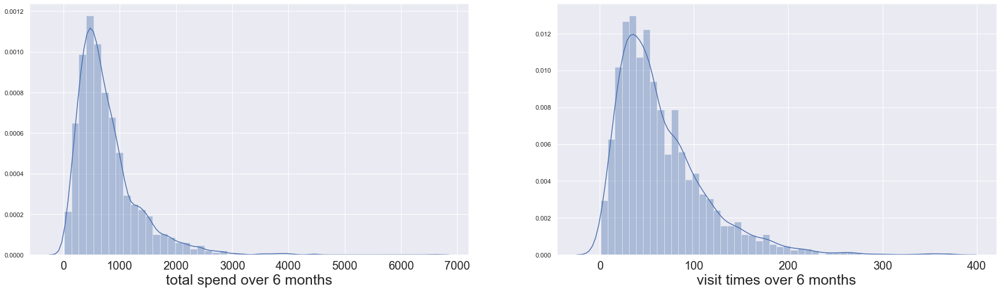

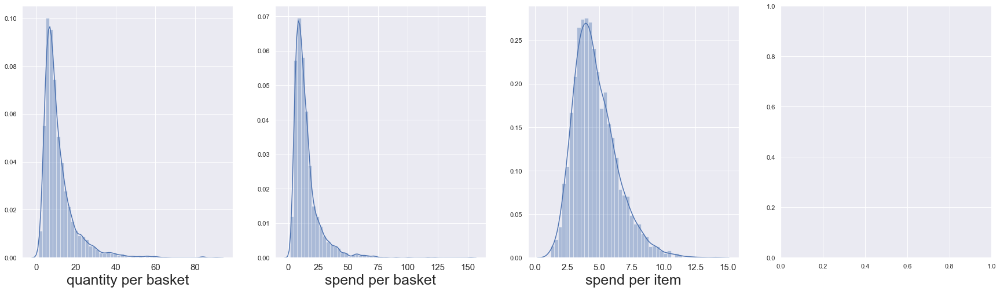

In [13]:
# get features: spend,  frequency and quantity 
total_spend_line_pos = pd.DataFrame(line_positive.groupby(by = 'customer_number')['spend'].agg('sum')).rename(columns = {'spend':'total_spend'})
total_baskets_line_pos = pd.DataFrame(line_positive.groupby(by = ['customer_number'])['purchase_time'].nunique()).rename(columns = {'purchase_time':'total_baskets'})
total_quantity_line_pos = pd.DataFrame(line_positive.groupby(by = ['customer_number'])['quantity'].agg('sum')).rename(columns = {'quantity':'total_quantity'})

# merge above three tables 
customers_line_pos = total_spend_line_pos.join(total_baskets_line_pos).join(total_quantity_line_pos)

# get average features
customers_line_pos['quantity/baskets'] = customers_line_pos['total_quantity'] / customers_line_pos['total_baskets']
customers_line_pos['spend/baskets'] = customers_line_pos['total_spend'] / customers_line_pos['total_baskets']
customers_line_pos['spend/quantity'] = customers_line_pos['total_spend'] / customers_line_pos['total_quantity']
customers_line_pos.head(2)

#plot
plt.rcParams['figure.figsize'] = (30,8)
fig,axes = plt.subplots(ncols = 2,nrows = 1)
sns.set()

ax = sns.distplot(customers_line_pos['total_spend'], ax = axes.flat[0])
ax.tick_params(axis='x',labelsize=20)
ax.set_xlabel('total spend over 6 months',fontsize=25)

ax = sns.distplot(customers_line_pos['total_baskets'], ax = axes.flat[1])
ax.tick_params(axis='x',labelsize=20)
ax.set_xlabel('visit times over 6 months',fontsize=25)


plt.rcParams['figure.figsize'] = (30,8)
fig,axes = plt.subplots(ncols = 4,nrows = 1)

ax = sns.distplot(customers_line_pos['quantity/baskets'], ax = axes.flat[0])
ax.tick_params(axis='x',labelsize=15)
ax.set_xlabel('quantity per basket',fontsize=25)

ax = sns.distplot(customers_line_pos['spend/baskets'], ax = axes.flat[1])
ax.tick_params(axis='x',labelsize=15)
ax.set_xlabel('spend per basket',fontsize=25)

ax = sns.distplot(cate_count_per_basket['basket_categories'], ax = axes.flat[2])
ax.tick_params(axis='x',labelsize=15)
ax.set_xlabel('spend per item',fontsize=25)

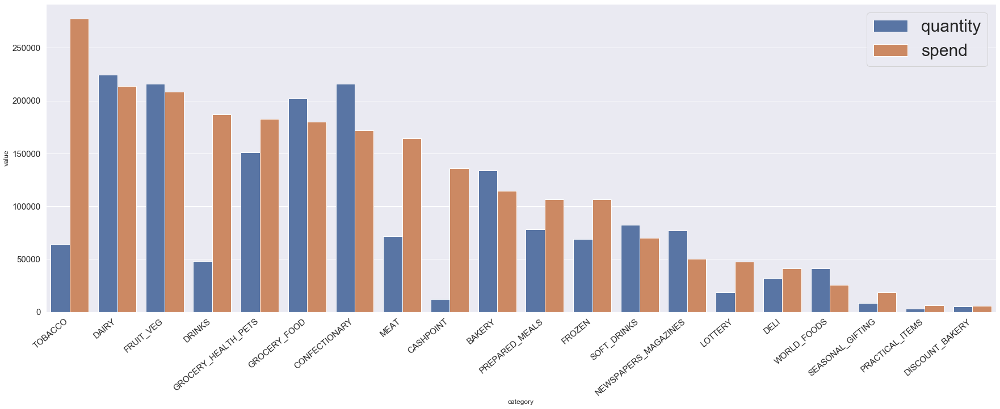

In [14]:
#get category spend and category quantity
category_spend_line_pos = pd.DataFrame(line_positive.groupby(by = ['customer_number','category'])['spend'].agg('sum'))
category_spend_line_pos = category_spend_line_pos.reset_index().pivot(columns = 'category',values='spend',index = 'customer_number').fillna(0)
category_count_line_pos = pd.DataFrame(line_positive.groupby(by = ['customer_number','category'])['quantity'].agg('sum'))
category_count_line_pos = category_count_line_pos.reset_index().pivot(columns = 'category',values='quantity',index = 'customer_number').fillna(0)

# merge 2 tables
a= pd.DataFrame(category_count_line_pos.sum(axis = 0),columns = ['quantity']).join(pd.DataFrame(category_spend_line_pos.sum(axis = 0),columns = ['spend'])).reset_index().sort_values('spend',ascending= False)
a = pd.melt(a,id_vars=['category'],value_vars=['quantity', 'spend'])
a.head()

# plot
plt.rcParams['figure.figsize'] = (30,10)
sns.barplot(x="category", y="value", hue="variable", data=a)
plt.tick_params(labelsize=15)
plt.xticks(rotation=40, ha="right") 
plt.legend(fontsize=30)


In [15]:
# consider about new customer during the period
min_purchase_month = pd.DataFrame((pd.to_datetime(line_positive['purchase_time']).dt.month)).groupby('customer_number').agg({'purchase_time':min})
print('customers start to buy from which month:')
print(min_purchase_month['purchase_time'].value_counts())
#--> almost all customers bought at march, so do not consider new customer.


customers start to buy from which month:
3    2985
4      15
Name: purchase_time, dtype: int64


min buy time and max buy time:
2007-03-01 07:06:00 ; 2007-08-31 21:55:00
   recency  count   percent  accum_percent
0        1    944  0.314667       0.314667
1        2    530  0.176667       0.491333
2        3    317  0.105667       0.597000
3        4    233  0.077667       0.674667
4        5    113  0.037667       0.712333
5        6     49  0.016333       0.728667
6        7    144  0.048000       0.776667
7        8     99  0.033000       0.809667
8        9     55  0.018333       0.828000
9       10     32  0.010667       0.838667


Text(0.5, 0, 'recent purchase day')

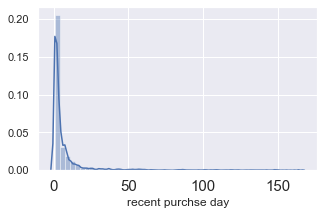

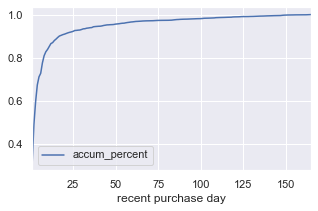

In [16]:
# get recency
print('min buy time and max buy time:')
print(line_positive['purchase_time'].min(),';',line_positive['purchase_time'].max())
now = pd.to_datetime("2007-09-01")
max_date_line_pos = line_positive.groupby('customer_number').agg({'purchase_time':max})
max_date_line_pos['recency'] = (now - pd.to_datetime(max_date_line_pos['purchase_time'])).dt.days+1
recency_line_pos = max_date_line_pos[['recency']]
recency_line_pos.head(2)

#plot recency
plt.rcParams['figure.figsize'] = (5,3)
ax = sns.distplot(recency_line_pos['recency'])
ax.tick_params(axis='x',labelsize=15)
ax.set_xlabel('recent purchse day',fontsize=12)

# plot accumulate graph
a = pd.DataFrame(recency_line_pos.groupby('recency')['recency'].agg('count')).rename(columns = {'recency':'count'}).reset_index()
a['percent'] = a['count']/3000
a['accum_percent'] = a['percent'].cumsum()
print(a.head(10))
ax = a.plot(x= 'recency' ,y='accum_percent',color='b',linestyle='-')
ax.set_xlabel('recent purchase day', fontsize=12)

#--> 60% customers purchased in recent 3 days, and 80% in recent 8 days.

# selecting features on common sense

In [146]:
# join below four tables to merge all needed features into one table
data_line_pos = customers_line_pos.join(recency_line_pos).join(category_spend_line_pos)
print(data_line_pos.shape)
data_line_pos.head(2)

#--> getting 27 features.

(3000, 27)


,total_spend,total_baskets,total_quantity,quantity/baskets,spend/baskets,spend/quantity,recency,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS
customer_number,,,,,,,,,,,,,,,,,,,,,,,,,,,
14,675.72,56,531,9.482143,12.066429,1.272542,2,18.09,0.0,23.22,172.58,0.0,1.25,113.45,25.29,11.10,56.05,11.28,0.0,182.37,6.40,0.0,23.36,5.07,5.31,0.0,20.90
45,585.73,33,655,19.848485,17.749394,0.894244,2,18.00,0.0,106.54,142.16,2.0,0.00,0.00,7.05,30.21,83.42,24.31,0.0,60.31,17.49,0.0,56.51,0.00,29.65,0.0,8.08


In [147]:
# compute count of 0 in each column
for i in data_line_pos.columns:
    count_of_0 = data_line_pos[data_line_pos[i] == 0].shape[0]
    print(i.ljust(20), count_of_0)

#--> some columns have many 0 value, such as DISCOUNT_BAKERY (2664).

total_spend          0
total_baskets        0
total_quantity       0
quantity/baskets     0
spend/baskets        0
spend/quantity       0
recency              0
BAKERY               37
CASHPOINT            1794
CONFECTIONARY        18
DAIRY                13
DELI                 1050
DISCOUNT_BAKERY      2664
DRINKS               915
FROZEN               152
FRUIT_VEG            19
GROCERY_FOOD         18
GROCERY_HEALTH_PETS  49
LOTTERY              1841
MEAT                 177
NEWSPAPERS_MAGAZINES 463
PRACTICAL_ITEMS      1810
PREPARED_MEALS       142
SEASONAL_GIFTING     1096
SOFT_DRINKS          224
TOBACCO              1443
WORLD_FOODS          593


In [148]:
#correlation of original data
corr_coeff = {}
for i in range(len(data_line_pos.columns)-1):
    for j in range(i+1,len(data_line_pos.columns)):
        a = data_line_pos.columns[i] + ' & ' + data_line_pos.columns[j]
        b = data_line_pos[[data_line_pos.columns[i]]].join(data_line_pos[[data_line_pos.columns[j]]]).corr()
        corr_coeff[a] = b.iloc[1,0]
corr_table = pd.DataFrame(corr_coeff,index = ['coeff']).T.sort_values('coeff',ascending = False)
pd.options.display.max_rows = None
corr_table

#--> strong correlations exist, up to 0.91

,coeff
quantity/baskets & spend/baskets,0.914582
total_spend & total_quantity,0.878885
total_quantity & DAIRY,0.779135
total_quantity & GROCERY_FOOD,0.753808
total_quantity & CONFECTIONARY,0.753123
total_quantity & BAKERY,0.703711
total_quantity & GROCERY_HEALTH_PETS,0.689371
total_spend & DAIRY,0.680254
total_quantity & FRUIT_VEG,0.671257
total_spend & GROCERY_FOOD,0.658181


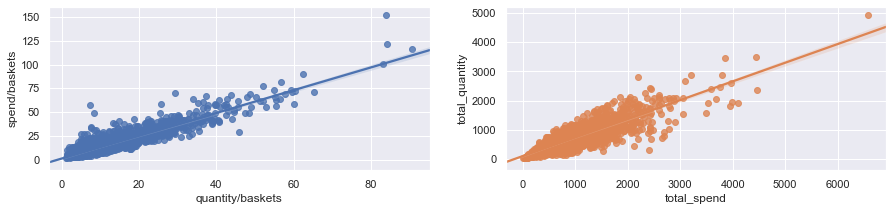

In [115]:
#plot correlation for coeff > 0.8 
plt.rcParams['figure.figsize'] = (15,3)
fig,axes = plt.subplots(ncols=2,nrows = 1)
sns.regplot(x="quantity/baskets", y="spend/baskets", data=data_line_pos[['quantity/baskets','spend/baskets']],ax = axes[0])
sns.regplot(x="total_spend", y="total_quantity", data=data_line_pos[['total_spend','total_quantity']],ax = axes[1])



In [149]:
# copy table which is used for feature updating. original features may be used later, so retain here.
data = data_line_pos.copy()

In [150]:
# handle features:

#total quantity is highly correlated with total spend, and CDO doesn't mention this, so delete.
data.drop(columns = ['total_quantity'], inplace = True)

# so many 0 values in DISCOUNT_BAKERY
# BAKERY and DISCOUNT_BAKERY is same category, so combine to a new category and drop original ones.
data['total_bakery'] = data['BAKERY'] + data['DISCOUNT_BAKERY']
data.drop(columns = ['BAKERY','DISCOUNT_BAKERY'],inplace = True)

# combine deli and prepared meal, as they are both pre-cooked food, customers can eat them conviniently.
data['deli+prepared_meal'] = data['DELI'] + data['PREPARED_MEALS']
data.drop(columns = ['DELI','PREPARED_MEALS'],inplace = True)

# drop seasonal gifting, PRACTICAL_ITEMS and world foods, because their spends just account for small percentage. 
data.drop(columns = ['SEASONAL_GIFTING','PRACTICAL_ITEMS','WORLD_FOODS'],inplace = True)


In [151]:
data.head(2)

,total_spend,total_baskets,quantity/baskets,spend/baskets,spend/quantity,recency,CASHPOINT,CONFECTIONARY,DAIRY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,SOFT_DRINKS,TOBACCO,total_bakery,deli+prepared_meal
customer_number,,,,,,,,,,,,,,,,,,,,,
14,675.72,56,9.482143,12.066429,1.272542,2,0.0,23.22,172.58,113.45,25.29,11.10,56.05,11.28,0.0,182.37,6.40,5.31,0.0,19.34,23.36
45,585.73,33,19.848485,17.749394,0.894244,2,0.0,106.54,142.16,0.00,7.05,30.21,83.42,24.31,0.0,60.31,17.49,29.65,0.0,18.00,58.51


In [152]:
#check how many features left
data.shape

(3000, 21)

# check distribution and correlation

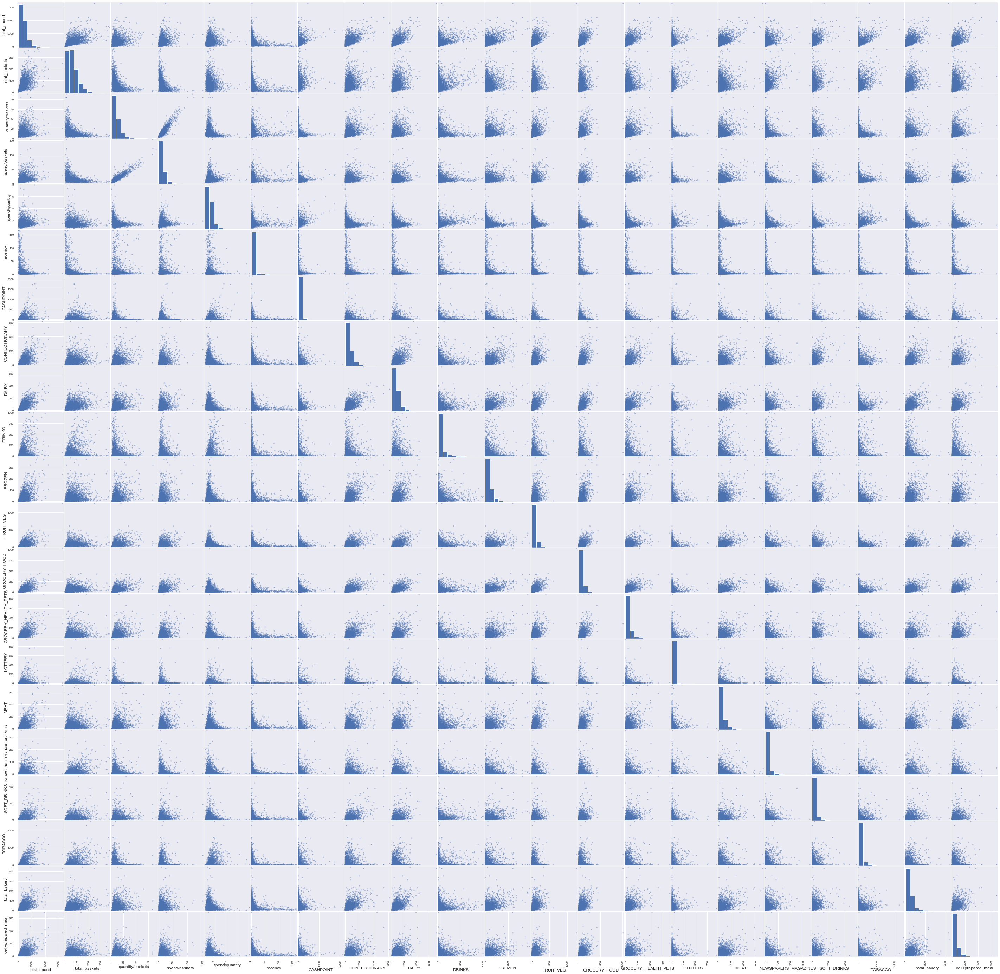

In [120]:
# check correaltion and distribution of original data
scatter = pd.plotting.scatter_matrix(data, figsize = (50,50))

#--> skewed

In [121]:
# log data
data_logged = np.log(data+1)
data_logged.head(2)

# check range of each column
data_logged.describe()

,total_spend,total_baskets,quantity/baskets,spend/baskets,spend/quantity,recency,CASHPOINT,CONFECTIONARY,DAIRY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,SOFT_DRINKS,TOBACCO,total_bakery,deli+prepared_meal
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,6.421393,3.945280,2.343314,2.592638,0.853006,1.574083,1.595164,3.655947,3.949032,2.501977,2.994608,3.786110,3.688137,3.578202,1.059118,3.327809,2.034531,2.451572,2.122791,3.321617,3.408498
std,0.701961,0.739172,0.544084,0.554493,0.194572,0.989651,2.104478,0.988582,0.908418,2.027932,1.228532,1.083663,1.013565,1.157986,1.584511,1.363772,1.353695,1.284257,2.385962,0.975788,1.140834
min,2.113843,0.693147,0.788457,0.898534,0.443507,0.693147,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.010550,3.496508,1.963946,2.202171,0.728994,0.693147,0.000000,3.094219,3.477850,0.000000,2.280084,3.165264,3.095012,2.952041,0.000000,2.613007,0.916291,1.559722,0.000000,2.791012,2.791931
50%,6.443439,3.988984,2.275610,2.549116,0.811953,1.386294,0.000000,3.767922,4.058286,2.626840,3.147380,3.949993,3.807328,3.690753,0.000000,3.524300,2.121662,2.540420,1.108563,3.458680,3.575011
75%,6.868583,4.465908,2.666856,2.915450,0.929972,2.079442,3.433987,4.332935,4.567754,4.191925,3.876137,4.547594,4.405773,4.359909,2.079442,4.295651,3.029527,3.393921,4.407084,3.983739,4.193360
max,8.793256,5.926926,4.519067,5.034493,2.188211,5.111988,7.667631,6.422224,6.563912,6.914065,5.957908,7.142013,6.925664,6.786096,6.853299,6.571275,5.865703,6.274103,7.820014,6.098905,6.536039


In [122]:
# after log, data range in some columns is (2,8), some are (0,2), so use standardization.

from sklearn.preprocessing import StandardScaler

stander = StandardScaler().fit(data_logged)
data_stand = stander.transform(data_logged)

data_stand = pd.DataFrame(data_stand, columns = data_logged.columns)
data_stand.head(2)


,total_spend,total_baskets,quantity/baskets,spend/baskets,spend/quantity,recency,CASHPOINT,CONFECTIONARY,DAIRY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,SOFT_DRINKS,TOBACCO,total_bakery,deli+prepared_meal
0,0.136590,0.132293,0.011690,-0.040750,-0.165039,-0.480523,-0.758112,-0.474262,1.329573,1.103850,0.223540,-1.193287,0.351088,-0.92437,-0.668531,1.381470,-0.024420,-0.474623,-0.889848,-0.316748,-0.188977
1,-0.066721,-0.566836,1.275692,0.610611,-1.100987,-0.480523,-0.758112,1.033892,1.117437,-1.233964,-0.739979,-0.318761,0.737784,-0.29971,-0.668531,0.578004,0.652175,0.756252,-0.889848,-0.386601,0.594091


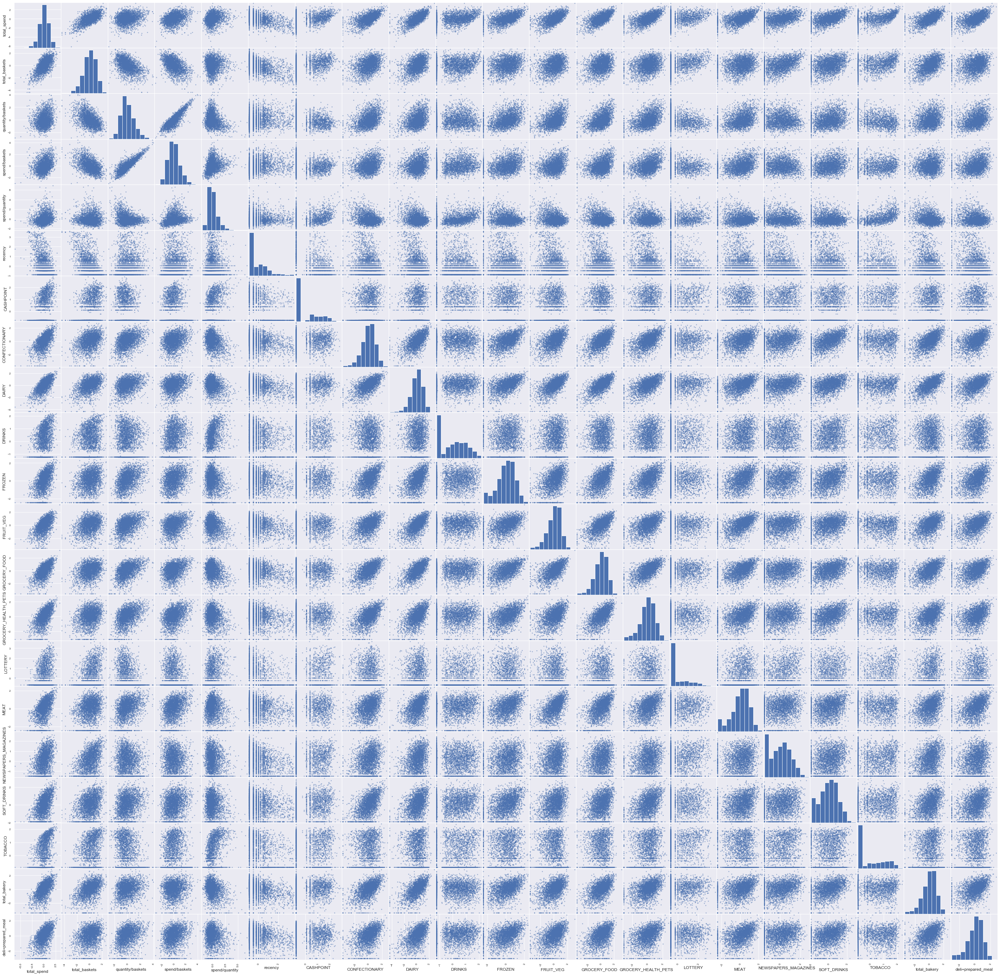

In [123]:
# check distribution again
scatter = pd.plotting.scatter_matrix(data_stand, figsize = (50,50))

#--> better and their are some correlations

# PCA-- to eliminate correlations and curse of dimensionality

   count_of_pc  accumu_variance
0            1         0.334668
1            2         0.488906
2            3         0.580742
3            4         0.633617
4            5         0.675371
5            6         0.714721
6            7         0.749880
7            8         0.781238
8            9         0.811706
9           10         0.840059


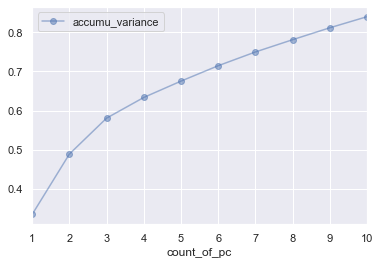

In [125]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

#apply PCA
pca = PCA(n_components=10)
pca.fit(data_stand)

# get accumulate variance percentage, to find a good "n"
from itertools import accumulate
a = pd.DataFrame(accumulate(pca.explained_variance_ratio_),columns = ['accumu_variance']).reset_index().rename(columns = {'index':'count_of_pc'})
a['count_of_pc'] = a['count_of_pc'] + 1
print(a.head(10))

a.plot(x='count_of_pc',y='accumu_variance',color='b',linestyle='-',marker='o',alpha=0.5)

#--> first 6 components account for 71%

,Explained Variance,total_spend,total_baskets,quantity/baskets,spend/baskets,spend/quantity,recency,CASHPOINT,CONFECTIONARY,DAIRY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,SOFT_DRINKS,TOBACCO,total_bakery,deli+prepared_meal
Dimension 1,0.3347,-0.3224,-0.1908,-0.1754,-0.1334,0.0916,0.1513,-0.0259,-0.2924,-0.3097,-0.0714,-0.2626,-0.2793,-0.3044,-0.2841,-0.0324,-0.2423,-0.1312,-0.2290,-0.0232,-0.2758,-0.2573
Dimension 2,0.1542,-0.1848,-0.4284,0.4306,0.3296,-0.2011,0.2443,-0.3086,0.0348,-0.0011,-0.0869,0.0691,0.0917,0.0974,0.0683,-0.3039,0.0729,-0.2157,-0.0408,-0.3270,-0.0591,0.0217
Dimension 3,0.0918,0.2088,-0.1891,0.1842,0.4834,0.5655,0.1419,0.2004,-0.0910,-0.1010,0.2771,-0.0095,-0.0656,-0.0388,0.0621,0.0994,0.0734,-0.1010,0.0792,0.3356,-0.1534,0.0069
Dimension 4,0.0529,0.0330,0.1215,-0.1822,-0.1208,0.1146,-0.2378,-0.3299,-0.2379,0.0042,0.6272,-0.0438,0.2355,0.0298,-0.0742,-0.2417,0.2803,-0.1747,-0.1516,-0.1661,-0.1429,0.0749
Dimension 5,0.0418,0.0932,0.0185,-0.0076,0.0821,0.1855,-0.3350,-0.0619,-0.1499,0.0747,-0.5315,-0.0086,0.1606,0.1421,-0.0149,0.0128,0.1313,-0.3458,-0.5400,0.1999,0.0760,0.0504
Dimension 6,0.0393,-0.0283,-0.1163,0.1449,0.1164,-0.0604,0.0355,-0.2137,-0.2027,-0.0452,0.0012,-0.0739,0.1433,-0.0890,-0.1837,0.5879,0.2438,0.5353,-0.2391,-0.1217,-0.0169,0.1610


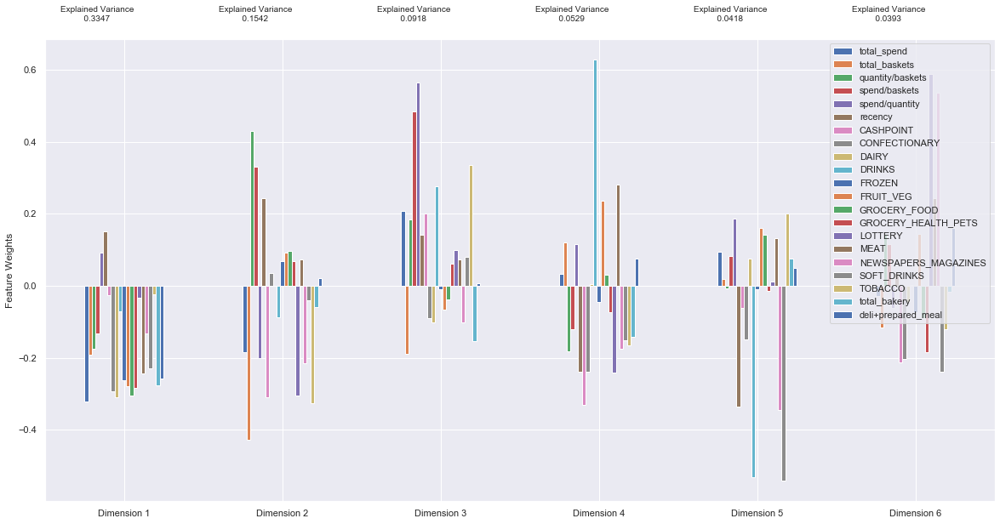

In [126]:
# use first 6 components
pca = PCA(n_components=6)
pca.fit(data_stand)

#-- import a helpful set of functions to ease displaying results.
import renders as rs

#-- Generate a PCA results plot 
pca_results = rs.pca_results(data_stand, pca)
pca_results

explanation of first 4 PCs

•	The first principal component(PC1): an increase in PC1 is mainly associated with the decrease of “total_spend” and food_related categories (such as “confectionary”, ”dairy”, and so on), because absolute values of their weights are higher. They have similar height which means that they together distinguish customers and no one is more significant. Thus, PC1 can be summarized as “spend and food”.

•	The second principal component(PC2): here an increase in PC2 is associated with an increase in “quantity/baskets”, “spend/baskets” and “recency” and a decrease of  “total_baskets”, and non-food-related categories (such as “cashpoint”, “lottery”, and so on) that affect just a little in PC1. Food categories in PC1 have small weights here. This makes sense as different PC should represent different features. PC2 can be described as “value of baskets and non-food”(high total basket means low corresponding value on per basket).

•	The third principal component(PC3): in this case an increase of “spend/baskets”, “spend/quantity”, “cashpoint”, “drinks” and “tobacco” causes an increase in PC3. Coincidentally, these three categories have relatively higher unit price than other categories. I refer PC3 as “high unit_price” dimension.

•	The forth principal component(PC4): spend on drink influences most, so I refer this as “drinks”.


In [127]:
# Transform the good data using the PCA fit above
reduced_data = pd.DataFrame(pca.transform(data_stand))

In [128]:
reduced_data.shape

(3000, 6)

In [129]:
# check correlation of new features
corr_coeff = {}
for i in range(reduced_data.shape[1]-1):
    for j in range(i+1,reduced_data.shape[1]):
        a = str(i) + ' & ' + str(j)
        b = reduced_data[[reduced_data.columns[i]]].join(reduced_data[[reduced_data.columns[j]]]).corr()
        corr_coeff[a] = b.iloc[1,0]

        corr_table = pd.DataFrame(corr_coeff,index = ['coeff']).T.sort_values('coeff',ascending = False)

corr_table.max()
#--> coeff is near to 0, correlation is eliminated.

coeff    0.00004
dtype: float64

# clustering

In [130]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

#-- using loop to find which K give the best result.
for k in range(2,10):
    clusterer = KMeans(n_clusters=k)
    clusterer.fit(reduced_data)
    
    #-- TODO: Predict the cluster for each data point
    preds = clusterer.predict(reduced_data)
    
    #-- Calculate a silhouette score 
    score = silhouette_score(reduced_data, preds, metric='euclidean')
    print("For k_clusters = {}. The average silhouette_score is : {})".format(k, score))
    
#--> among 5, 6, and 7, silhouette_score highest when k = 5

For k_clusters = 2. The average silhouette_score is : 0.244312016401104)
For k_clusters = 3. The average silhouette_score is : 0.17631767015705002)
For k_clusters = 4. The average silhouette_score is : 0.17933315936309457)
For k_clusters = 5. The average silhouette_score is : 0.17578636520364194)
For k_clusters = 6. The average silhouette_score is : 0.1668573604904017)
For k_clusters = 7. The average silhouette_score is : 0.15879433407771218)
For k_clusters = 8. The average silhouette_score is : 0.16101610217294055)
For k_clusters = 9. The average silhouette_score is : 0.15669583843170584)


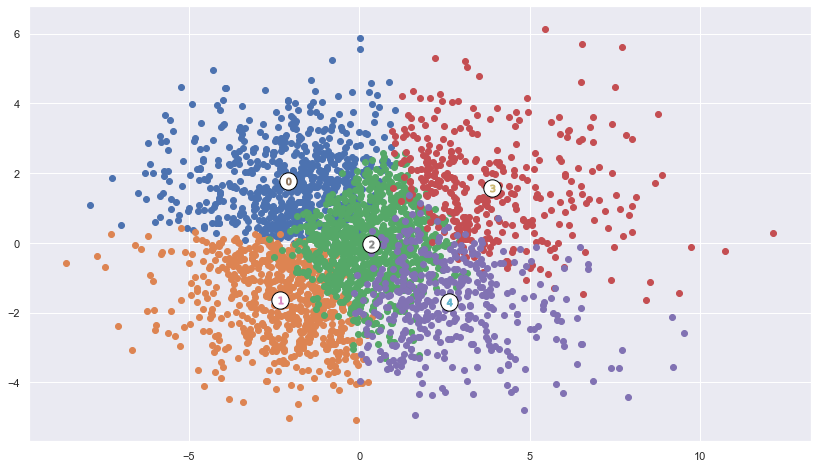

In [131]:
# use k = 6 to fit reduced_data
clusterer = KMeans(n_clusters=5).fit(reduced_data)
preds = clusterer.predict(reduced_data)
centres = clusterer.cluster_centers_

#-- Put the predictions into a pandas dataframe format
assignments = pd.DataFrame(preds, columns = ['Cluster'])

#-- Put the predictions into a pandas dataframe format
plot_data = pd.concat([assignments, reduced_data], axis = 1)

#-- Color the points based on assigned cluster (n.b scatter will do this for us automatically)
plt.rcParams['figure.figsize'] = (14.0, 8.0)

for i, c in plot_data.groupby('Cluster'):  
    plt.scatter(c[0], c[1])
    
#-- Plot where the cluster centers are
for i, c in enumerate(centres):
    plt.scatter(x = c[0], y = c[1], color = 'white', edgecolors = 'black', marker = 'o', s=300);
    plt.scatter(x = c[0], y = c[1], marker='${}$'.format(i), alpha = 1, s=50);

# results and explaination

In [145]:
# Inverse transform the centres to log_centres and then true_centres
standed_centres = pca.inverse_transform(centres)
log_centres = stander.inverse_transform(standed_centres)
true_centres = np.exp(log_centres)

#-- Display the true centres
segments = ['Segment {}'.format(i) for i in range(0, len(centres))]
true_centres = pd.DataFrame(np.round(true_centres), columns = data_logged.columns)
true_centres.index = segments
pd.options.display.max_columns = None
true_centres

,total_spend,total_baskets,quantity/baskets,spend/baskets,spend/quantity,recency,CASHPOINT,CONFECTIONARY,DAIRY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,SOFT_DRINKS,TOBACCO,total_bakery,deli+prepared_meal
Segment 0,850.0,37.0,20.0,25.0,2.0,6.0,2.0,72.0,90.0,15.0,46.0,97.0,91.0,85.0,1.0,71.0,6.0,20.0,4.0,41.0,59.0
Segment 1,1321.0,113.0,9.0,13.0,2.0,3.0,20.0,74.0,97.0,25.0,37.0,70.0,67.0,69.0,9.0,49.0,22.0,29.0,41.0,56.0,57.0
Segment 2,495.0,59.0,9.0,10.0,2.0,4.0,3.0,36.0,52.0,8.0,18.0,45.0,38.0,29.0,2.0,24.0,8.0,9.0,3.0,29.0,28.0
Segment 3,201.0,17.0,11.0,14.0,2.0,16.0,2.0,15.0,17.0,6.0,7.0,14.0,13.0,11.0,1.0,8.0,3.0,5.0,2.0,9.0,10.0
Segment 4,521.0,53.0,6.0,11.0,3.0,5.0,21.0,15.0,23.0,17.0,7.0,16.0,15.0,15.0,6.0,12.0,5.0,6.0,86.0,13.0,14.0


# use mean to analyze each group 

In [133]:
#-- Join the segment assignments to the original data 
final_assigments = pd.concat([assignments, data.reset_index()], axis = 1)
#print(final_assigments.shape)
#print(assignments.shape)

#-- Create a loop that describes summary statistics for each segment: using mean
seg = {}
for c, d in final_assigments.groupby('Cluster'):  
    seg[c] = list(d.mean())

segments_mean = pd.DataFrame(seg, index = final_assigments.columns).drop(['Cluster'],axis = 0)
print(segments_mean.shape)

# export segment files
for c, d in final_assigments.groupby('Cluster'):  
    d.to_csv('segment_{}.csv'.format(c))
    

(22, 5)


In [135]:
# customer_number is not feature, so drop it.
segments_mean = segments_mean.drop('customer_number', axis = 0)
segments_mean.T

,total_spend,total_baskets,quantity/baskets,spend/baskets,spend/quantity,recency,CASHPOINT,CONFECTIONARY,DAIRY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,SOFT_DRINKS,TOBACCO,total_bakery,deli+prepared_meal
0,985.728600,42.470769,21.669782,27.077503,1.256521,7.901538,11.295538,91.922431,104.292908,58.722338,61.026431,120.022277,103.796985,105.703831,2.124862,95.841585,11.474985,33.705692,35.012400,53.427662,74.524154
1,1358.965289,120.213826,8.794029,12.469553,1.449311,2.556270,106.875997,88.417058,110.268183,113.142540,55.089453,93.836576,85.026977,96.847315,43.579582,82.068714,35.092476,45.772219,235.244277,64.357122,77.984341
2,511.627361,63.580442,8.279480,9.403377,1.142956,4.770768,17.163554,43.838738,60.506709,36.072587,25.476625,57.926898,46.571367,39.381609,7.895899,38.443712,14.621125,13.802082,22.690032,35.172093,38.455899
3,213.982616,19.160763,11.163948,14.306167,1.315766,36.108992,7.207902,20.005368,20.982698,23.158883,10.514796,20.919046,18.556703,20.649482,1.970027,16.207084,5.718856,6.673651,8.274033,11.009264,15.416431
4,639.653195,62.582927,5.631898,12.018017,2.201714,6.948780,105.377902,20.245854,29.971512,86.297439,10.678146,22.492415,20.897780,21.374610,26.377073,20.417854,11.391220,9.691951,204.751341,19.091976,20.676024


In [136]:
# get mean of all customer, used to compare with each segment
pd.DataFrame(data.mean()).T

,total_spend,total_baskets,quantity/baskets,spend/baskets,spend/quantity,recency,CASHPOINT,CONFECTIONARY,DAIRY,DRINKS,FROZEN,FRUIT_VEG,GROCERY_FOOD,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,SOFT_DRINKS,TOBACCO,total_bakery,deli+prepared_meal
0,771.115683,65.178333,11.278426,14.8256,1.396917,9.121333,45.330583,57.359467,71.302683,62.24349,35.46602,69.456163,60.00753,60.91346,15.844753,54.74102,16.65339,23.309243,92.547613,40.02496,49.21784


In [138]:
# plot segments' performance on each feature
# for better plot and undertanding, change the name of table
segments_mean = segments_mean.rename(columns={0:'seg_0',1:'seg_1',2:'seg_2',3:'seg_3',4:'seg_4'})
segments_mean.head(2)

# for better plot, use data over means of all customers to inplace original data, because the range of original mean data varis hugely among features
all_mean = pd.DataFrame(data.reset_index(drop = True).mean()).rename(columns = {0:'all_mean'})
all_feature_mean = segments_mean.join(all_mean)
all_feature_mean.head(2)
for i in range(5):
    all_feature_mean['seg_{}'.format(i)] =  all_feature_mean['seg_{}'.format(i)] / all_feature_mean['all_mean']
all_feature_mean = all_feature_mean.drop(columns = ['all_mean'])
all_feature_mean.head(2)

# for better plot, change the order of index
all_feature_mean = all_feature_mean.iloc[[0,1,2,3,4,5,7,8,10,11,12,13,15,17,19,20,18,9,14,16,6],:]

all_feature_mean = all_feature_mean.reset_index()

print(all_feature_mean.shape)
all_feature_mean.head()

(21, 6)


,index,seg_0,seg_1,seg_2,seg_3,seg_4
0,total_spend,1.278315,1.762336,0.663490,0.277497,0.829517
1,total_baskets,0.651609,1.844383,0.975484,0.293974,0.960180
2,quantity/baskets,1.921348,0.779721,0.734099,0.989850,0.499351
3,spend/baskets,1.826402,0.841083,0.634266,0.964964,0.810626
4,spend/quantity,0.899496,1.037507,0.818199,0.941907,1.576124


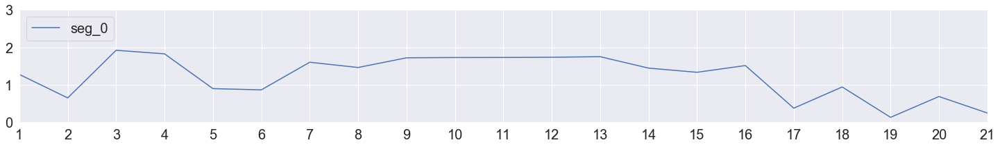

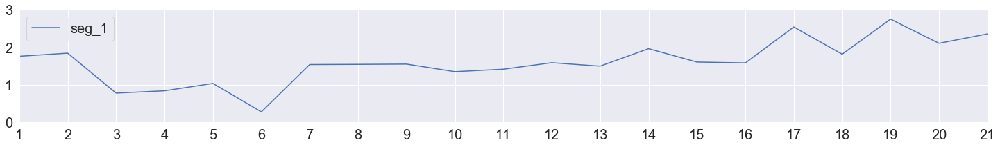

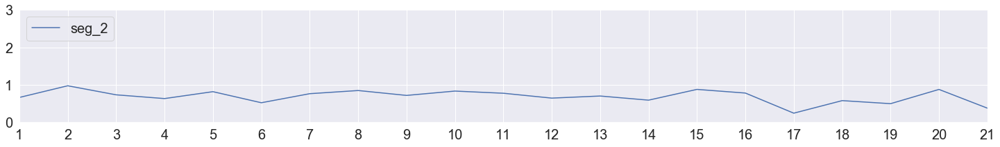

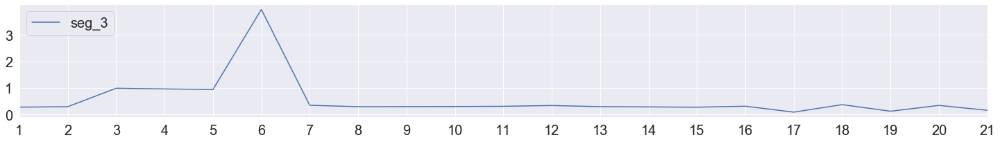

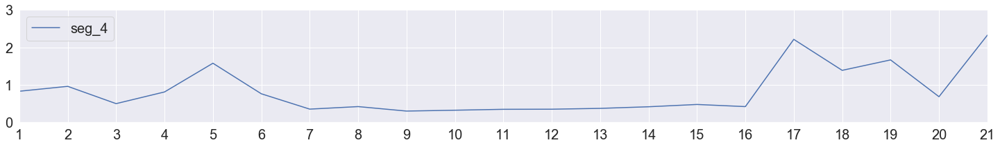

In [139]:
#plot to see the traits of each segment
plt.rcParams['figure.figsize'] = (25,3)
for i in range(5):
    all_feature_mean.plot(x = 'index', y = 'seg_{}'.format(i) ,color='b',linestyle='-')
    plt.xlabel(None)
    plt.legend(loc='upper left', fontsize = 20)
    plt.tick_params(labelsize=20)
    plt.xticks(np.arange(0,21,1),tuple(str(i) for i in range(1,22)))
    plt.yticks(np.arange(0, 4,1),tuple(str(i) for i in range(0,4)))


In [140]:
# get the count and percent of each segment
count_percent = final_assigments.groupby('Cluster')['total_spend'].count() 
count_percent = pd.DataFrame(count_percent).rename(columns = {'total_spend':'count'})
count_percent['percent'] = count_percent['count'] / 3000
count_percent

,count,percent
Cluster,,
0,650,0.216667
1,622,0.207333
2,951,0.317000
3,367,0.122333
4,410,0.136667


Text(0, 0.5, '')

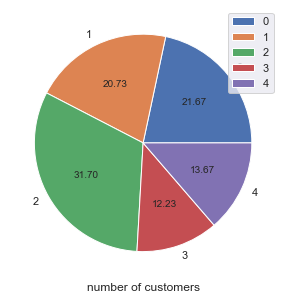

In [153]:
#proportion of  customer of each cluster
a = pd.DataFrame(final_assigments.groupby(by = 'Cluster')['total_spend'].count()).rename(columns = {'total_spend':'count'})
plot = a.plot.pie(y='count', autopct='%.2f',figsize=(5, 5))
plot.legend(loc = 'upper right')
plot.set_xlabel('number of customers')
plot.set_ylabel('')

Text(0, 0.5, '')

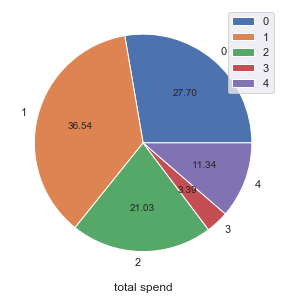

In [154]:
#proportion of total spend of each cluster
a = pd.DataFrame(final_assigments.groupby(by = 'Cluster')['total_spend'].agg('sum'))
plot = a.plot.pie(y='total_spend', autopct='%.2f',figsize=(5, 5))
plot.set_xlabel('total spend')
plot.set_ylabel('')


Text(0, 0.5, '')

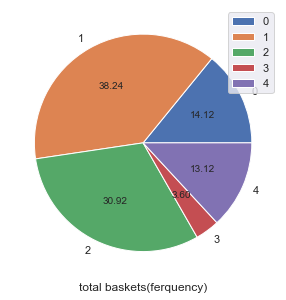

In [155]:
#proportion of baskets of each cluster
a = pd.DataFrame(final_assigments.groupby(by = 'Cluster')['total_baskets'].sum())
plot = a.plot.pie(y='total_baskets', autopct='%.2f',figsize=(5, 5))
plot.legend(loc = 'upper right')
plot.set_xlabel('total baskets(ferquency)')
plot.set_ylabel('')